In [ ]:
import pandas as pd
from pandas_profiling import ProfileReport
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import cufflinks as cf
from scipy import stats

import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)  

# Some styling
sns.set_style("whitegrid")
plt.style.use("fivethirtyeight")

import plotly.io as pio
pio.renderers.default = 'colab'
pio.templates.default = 'ggplot2'
%matplotlib inline

# Disable warnings 
import warnings
warnings.filterwarnings('ignore')

We will use only the dev set (data until 2015) for EDA

In [55]:
raw_data_link = 'https://raw.githubusercontent.com/elvanselvano/purwadhika-final-project/main/dataset/dev.csv'
df = pd.read_csv(raw_data_link)

In [56]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 102661 entries, 0 to 102660
Data columns (total 49 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   BATHRM              102661 non-null  int64  
 1   HF_BATHRM           102661 non-null  int64  
 2   HEAT                102661 non-null  object 
 3   AC                  102661 non-null  object 
 4   NUM_UNITS           66728 non-null   float64
 5   ROOMS               102661 non-null  int64  
 6   BEDRM               102661 non-null  int64  
 7   AYB                 102511 non-null  float64
 8   YR_RMDL             55371 non-null   float64
 9   EYB                 102661 non-null  int64  
 10  STORIES             66715 non-null   float64
 11  SALEDATE            102661 non-null  object 
 12  PRICE               75207 non-null   float64
 13  QUALIFIED           102661 non-null  object 
 14  SALE_NUM            102661 non-null  int64  
 15  GBA                 66728 non-null

In [57]:
#casting data types
df['NUM_UNITS'] = df['NUM_UNITS'].astype(pd.Int64Dtype())
df['KITCHENS'] = df['KITCHENS'].astype(pd.Int64Dtype())
df['USECODE'] = df['USECODE'].astype(pd.Int64Dtype()).astype('category')
df['ZIPCODE'] = df['ZIPCODE'].astype(pd.Int64Dtype()).astype('category')
df['CMPLX_NUM'] = df['CMPLX_NUM'].astype(pd.Int64Dtype())
df['CENSUS_TRACT'] = df['CMPLX_NUM'].astype(pd.Int64Dtype())
df['SALEDATE'] = pd.to_datetime(df['SALEDATE'])

## **PRICE**

### Qualified Price

The QUALIFIED feature is internally-used indicator to reflect if a sale is representative of market value according to the office's internal criteria. The author of the dataset suggest to drop the 'U' records.

Before, we want to compare these value with ROOMS to see the distribution.

In [59]:
q = df[df['QUALIFIED']=='Q']
u = df[df['QUALIFIED']=='U']

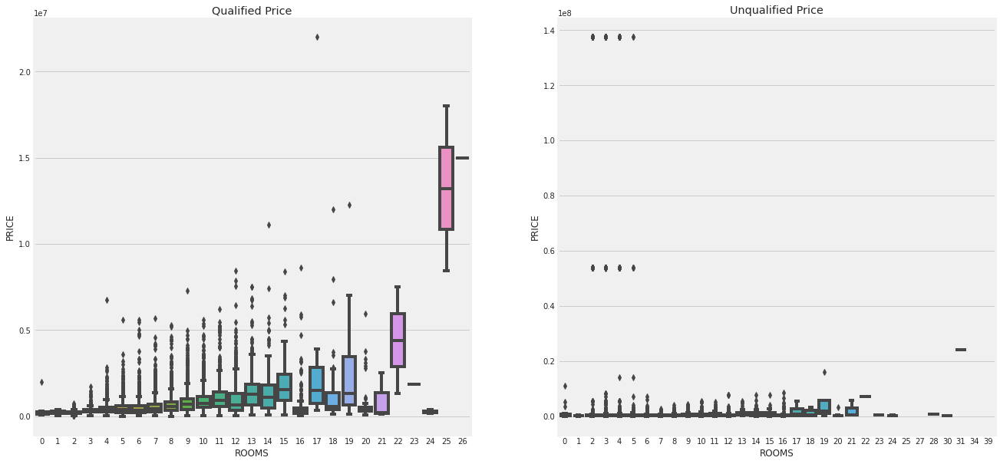

In [116]:
fig,ax = plt.subplots(1,2,figsize=(20,10))
sns.boxplot(x='ROOMS', y='PRICE', data=q, ax=ax[0]).set_title('Qualified Price')
sns.boxplot(x='ROOMS', y='PRICE', data=u, ax=ax[1]).set_title('Unqualified Price')
plt.show()

Based on the chart above, we can agree that the 'U' means it does not reflect the market value, we will drop it and QUALIFIED feature since it only contains 1 value of 'Q'.

In [64]:
df_q = df[df['QUALIFIED']=='Q']
df_q = df_q.drop('QUALIFIED', axis=1)

In [65]:
print('Before removing unqualified:', df.shape)
print('After removing unqualified:', df_q.shape)

Before removing unqualified: (102661, 49)
After removing unqualified: (58192, 48)


### Price by Year

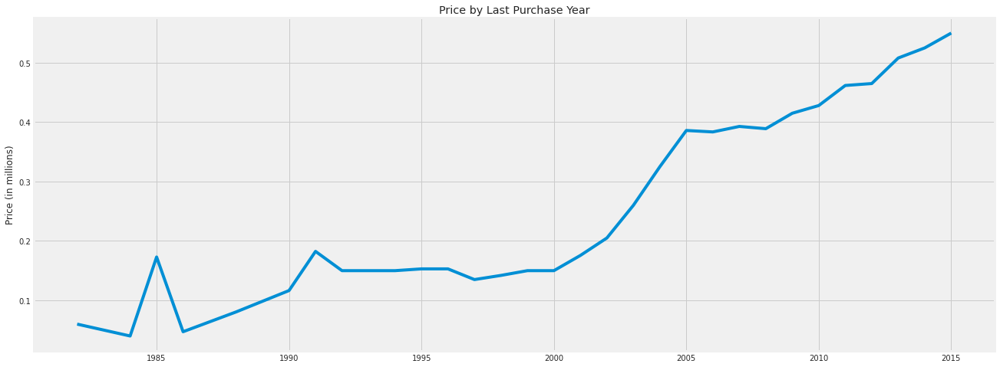

In [68]:
plt.figure(figsize=(20,8))
df_t = df_q.copy()
df_t['PRICE_MIL'] = df_q['PRICE']/1e6
yearly_med_price = df_t.groupby('SALEYEAR').median('PRICE_MIL')
sns.lineplot(x='SALEYEAR',y='PRICE_MIL',data=yearly_med_price,dashes=True)
plt.title('Price by Last Purchase Year')
plt.xlabel('')
plt.ylabel('Price (in millions)')
plt.show()

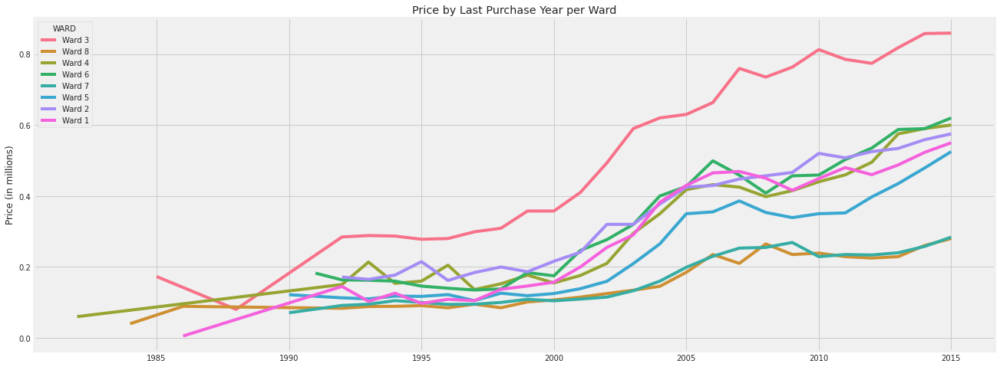

In [69]:
plt.figure(figsize=(20,8))
yearly_ward_price = df_t.groupby(['SALEYEAR','WARD']).median()
sns.lineplot(x='SALEYEAR',y='PRICE_MIL',data=yearly_ward_price , hue='WARD')
plt.title('Price by Last Purchase Year per Ward')
plt.xlabel('')
plt.ylabel('Price (in millions)')
plt.show()

In [79]:
fig = px.histogram(df_t, x='PRICE', nbins=200
                   , title='Distribution of Properties Price in DC',
                   color_discrete_sequence=px.colors.sequential.RdBu)

fig.update_layout(showlegend=False, margin=dict(l=20,r=20,t=40,b=20))
fig.show()

For the purpose of data visualization, we will only use **95% data** **(2.5% - 97.5%) in this EDA** in order to gain better insights of the data

In [91]:
p2_5 = df_t['PRICE'].quantile(0.025)
p97_5 = df_t['PRICE'].quantile(0.975)

In [100]:
#Get 95% data
df_viz_95 = df_t[(df_t['PRICE'] >= p2_5) & (df_t['PRICE'] <= p97_5)]

In [101]:
df_viz_95.PRICE.describe()

count    5.519800e+04
mean     4.554645e+05
std      2.856890e+05
min      8.300000e+04
25%      2.450000e+05
50%      3.850000e+05
75%      6.010000e+05
max      1.550000e+06
Name: PRICE, dtype: float64

In [111]:
fig = px.histogram(df_viz_95, x='PRICE', nbins=50
                   ,marginal='box',title='Distribution of Properties Price in DC (95% data)',
                   color_discrete_sequence=px.colors.sequential.RdBu)

fig.update_layout(showlegend=False, margin=dict(l=20,r=20,t=40,b=20))
fig.show()

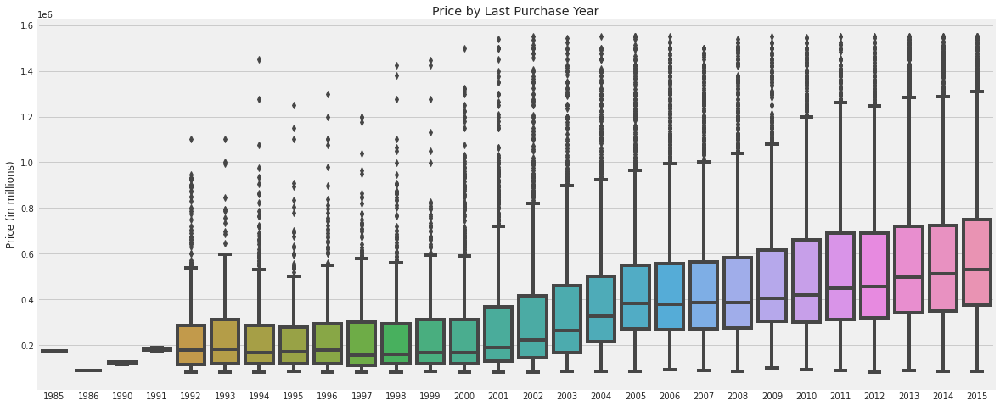

In [106]:
plt.figure(figsize=(18, 8))
sns.boxplot(x=df_viz_95['SALEYEAR'].dropna().astype(int), y=df_viz_95['PRICE'])
plt.title('Price by Last Purchase Year')
plt.xlabel('')
plt.ylabel('Price (in millions)')
plt.show()

The first chart shows the distribution of the price appears to be right-skewed. The range of the most expensive properties to the median, seems to be far higher than the gap to the lowest. This can reflect to the inequality of DC citizen. We also want to analyze the price distribution between property type and location

## **Residential vs Condominium**

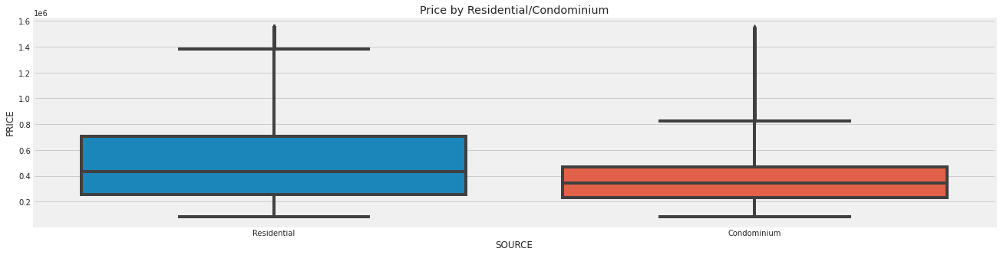

In [225]:
plt.figure(figsize=(20,5))
sns.boxplot(x='SOURCE', y='PRICE', data=df_viz_95).set_title('Price by Residential/Condominium')
plt.show()

Despite the difference is vague, the residential price is more expensive than the condominium in DC

## **LOCATION**

### Distribution by Region

In [114]:
quadrant = df_viz_95[~df_viz_95['QUADRANT'].isna()]
fig = px.scatter_mapbox(quadrant, lat='LATITUDE', lon='LONGITUDE', color='QUADRANT', hover_data=['QUADRANT', 'PRICE'],
                        color_discrete_sequence=px.colors.qualitative.Vivid, zoom=10, height=400, width=800, opacity=1,
                        title='Distribution of Properties by Quadrant')
fig.update_traces(marker=dict(size=5))
fig.update_layout(mapbox_style='stamen-terrain')
fig.update_layout(margin=dict(l=10,r=0,t=40,b=10))
fig.show()

In [115]:
fig = px.scatter_mapbox(df_viz_95, lat='LATITUDE', lon='LONGITUDE', color='WARD', hover_data=['WARD', 'PRICE'],
                        color_discrete_sequence=px.colors.qualitative.Vivid, zoom=10, height=400, width=800, opacity=1,
                        title='Distribution of Properties by Wards')
fig.update_traces(marker=dict(size=5))
fig.update_layout(mapbox_style='stamen-terrain')
fig.update_layout(margin=dict(l=10,r=0,t=40,b=10))
fig.show()

In [125]:
fig = px.scatter_mapbox(df_viz_95, lat='LATITUDE', lon='LONGITUDE', color='ZIPCODE', hover_data=['PRICE'],
                        color_discrete_sequence=px.colors.qualitative.Alphabet, zoom=10, height=400, width=800, opacity=1,
                        title='Distribution of Properties by Zipcode')
fig.update_traces(marker=dict(size=5))
fig.update_layout(mapbox_style='stamen-terrain')
fig.update_layout(margin=dict(l=10,r=0,t=40,b=10))
fig.show()

In [158]:
fig = px.scatter_mapbox(df_viz_95, lat='LATITUDE', lon='LONGITUDE', color='ASSESSMENT_NBHD', hover_data=['WARD', 'PRICE'],
                        color_discrete_sequence=px.colors.qualitative.Alphabet, zoom=10, height=400, width=800, opacity=1,
                        title='Distribution of Properties by Neighborhood')
fig.update_traces(marker=dict(size=5))
fig.update_layout(mapbox_style='stamen-terrain')
fig.update_layout(margin=dict(l=10,r=0,t=40,b=10))
fig.show()

### House Style in Each Region

In [127]:
style = df_viz_95[~df_viz_95['STYLE'].isna()].copy() #remove missing data style
fig = px.scatter_mapbox(style, lat='LATITUDE', lon='LONGITUDE', color='STYLE', hover_data=['STYLE', 'WARD'],
                        color_discrete_sequence=px.colors.qualitative.Prism, zoom=10, height=400, width=800, opacity=1,
                        title='House Style Mapping')
fig.update_traces(marker=dict(size=5))
fig.update_layout(mapbox_style='stamen-terrain')
fig.update_layout(margin=dict(l=10,r=0,t=40,b=10))
fig.show()

Most of the residential in DC is dominated by 2 Story House. Besides,in the NorthWest (Ward 1,2,3,4), the number of 2.5 Story is quite high, while in the Ward 7, 1 Story residential is also common.

### Regional Price Distribution

In [131]:
df_viz_95.PRICE.describe()

count    5.519800e+04
mean     4.554645e+05
std      2.856890e+05
min      8.300000e+04
25%      2.450000e+05
50%      3.850000e+05
75%      6.010000e+05
max      1.550000e+06
Name: PRICE, dtype: float64

In [152]:
#grouping price
price_cat_df = df_viz_95.copy()
label = ['<300k','300-600k','600-900k','900k-1.2M','1.2-1.5M','>1.5M']
price_cat_df['PRICE_CAT'] = pd.cut(df_viz_95['PRICE'],bins=(np.arange(0,19,3)*100000).tolist(),labels=label)

In [156]:
fig = px.scatter_mapbox(price_cat_df, lat='LATITUDE', lon='LONGITUDE', color='PRICE_CAT', hover_data=['PRICE', 'WARD'],
                        color_discrete_sequence=px.colors.qualitative.Vivid, zoom=10, height=400, width=800, opacity=0.5,
                        title='Price Mapping')
fig.update_traces(marker=dict(size=3))
fig.update_layout(mapbox_style='stamen-terrain',margin=dict(l=10,r=0,t=40,b=10), legend_traceorder='grouped')
fig.show()

The map above indicate the price distribution of residential seems different in each location. We can also see the image from DC government entitled Median Household Income below. It appears the price distribution of properties reflects to the household income. In Ward 3, where the properties price is the highest, has also the highest median household income than the others. In contrary, Ward 7 and 8, where the price is the lowest, have the lowest median household income.

We might look into the detail of price distribution in several location features.

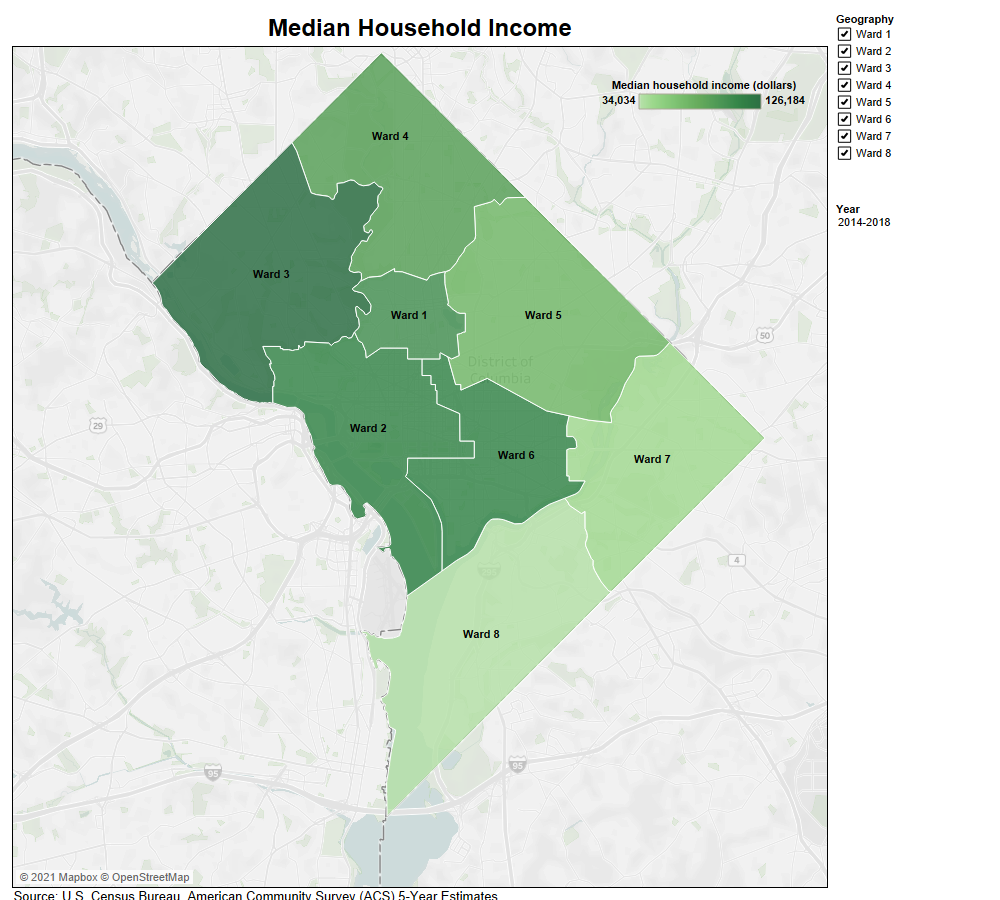

In [162]:
#define function of boxplot vs price_trans
def boxplot_cat_price(df,features,rows,cols,fig_size,title,pad=10,rotation=0,ord=True):
  df_no_na = df[features].copy().dropna()

  fig, ax = plt.subplots(rows,cols,figsize=fig_size)
  for i in range(len(features)-1):
    if ord==True:
      table = df_no_na.groupby([features[i]],as_index=False)['PRICE'].median().sort_values(by='PRICE',ascending=False)
      sns.boxplot(x=features[i],y='PRICE',data=df_no_na,ax=ax[i],order=table[features[i]].to_list()).set_title('Price by '+ features[i],fontsize=17)
    elif ord==False :
      sns.boxplot(x=features[i],y='PRICE',data=df_no_na,ax=ax[i]).set_title('Price by '+ features[i],fontsize=17)
  for i in fig.axes:
    plt.sca(i)
    plt.xticks(rotation=rotation)
  fig.suptitle(title, fontsize=25, fontweight='bold')
  fig.tight_layout(pad=pad)
  plt.show()

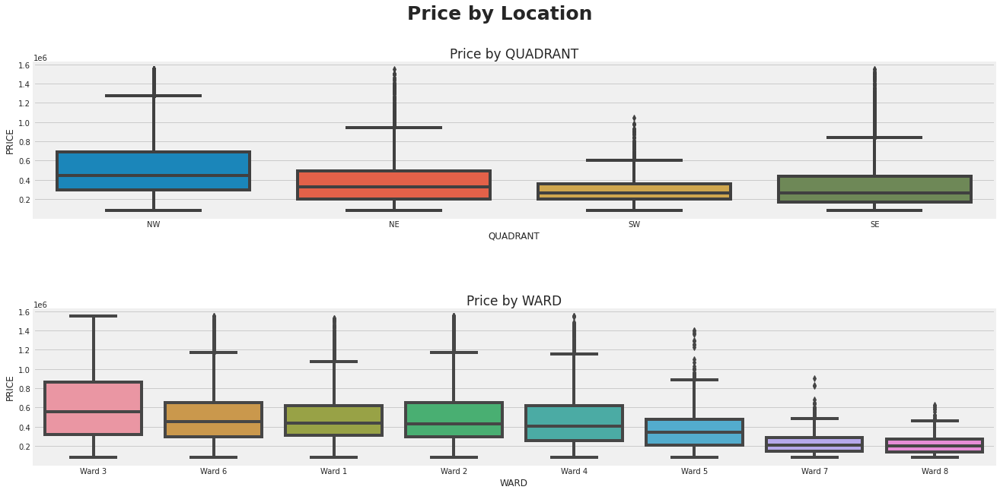

In [163]:
boxplot_cat_price(df_viz_95,['QUADRANT','WARD','PRICE'],2,1,(20,10),'Price by Location',7)

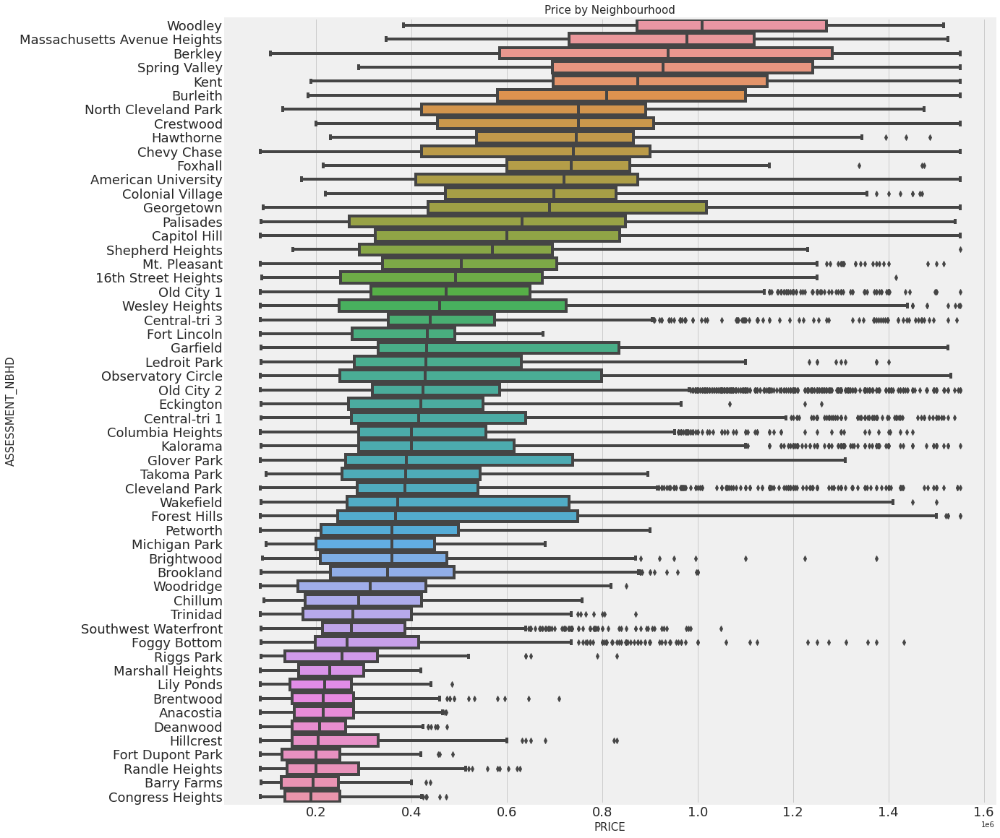

In [164]:
fig=plt.figure(figsize=(17,20))

table = df_viz_95.groupby(['ASSESSMENT_NBHD'],as_index=False)['PRICE'].median().sort_values(by='PRICE',ascending=False)

sns.boxplot(data=df_viz_95,x='PRICE',y='ASSESSMENT_NBHD',order=table['ASSESSMENT_NBHD'].to_list());
plt.yticks(fontsize=18);
plt.xticks(fontsize=18);
plt.title('Price by Neighbourhood',fontsize=15)
plt.ylabel("ASSESSMENT_NBHD",fontsize=15);
plt.xlabel("PRICE",fontsize=15);

In [205]:
#since the distribution is not normal, we will use the non-parametric test instead
#define function kruskal-wallis test vs price for all categorical value in each feature
def kruskal_price(feature,df):
  group_df = df[[feature, 'PRICE']].dropna().groupby([feature])
  group_list =[]
  val = df[feature].dropna().unique()
  for i in val:
    group_list.append(group_df.get_group(i)['PRICE'])
  
  h_stat, p_val = stats.kruskal(*group_list)
  print('Kruskal-Wallis Test results of {}\nH Stat = {}\nP = {}'.format(feature,h_stat, p_val))

In [210]:
for i in ['QUADRANT','WARD','ASSESSMENT_NBHD']:
  kruskal_price(i,df_t)
  print()

Kruskal-Wallis Test results of QUADRANT
H Stat = 6246.667443988654
P = 0.0

Kruskal-Wallis Test results of WARD
H Stat = 12268.472732395916
P = 0.0

Kruskal-Wallis Test results of ASSESSMENT_NBHD
H Stat = 18097.056231613544
P = 0.0



Since all the P-Value is below the alpha 0.05, we reject H0 which means the the population distribution for each features vs price are different. This shows all three features (Quadrant,Ward, and Assessment NBHD) can distinguish price value.

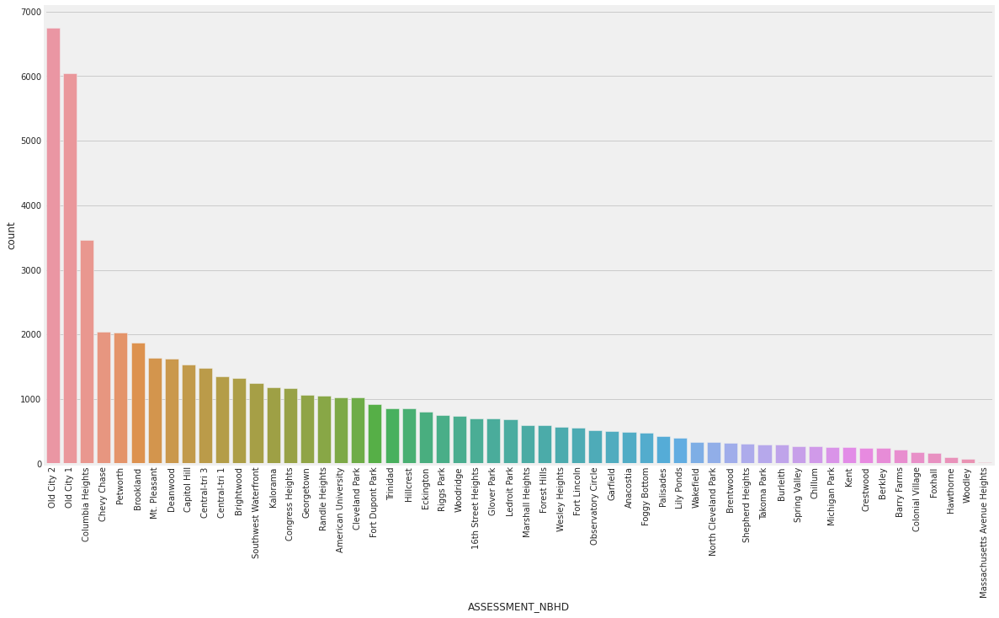

In [168]:
plt.figure(figsize=(18,10))
ca_count=sns.countplot(x=df_viz_95['ASSESSMENT_NBHD'], order = df_viz_95['ASSESSMENT_NBHD'].value_counts().index)
ca_count.set_xticklabels(ca_count.get_xticklabels(),rotation=90)
plt.show()

## **AREA**

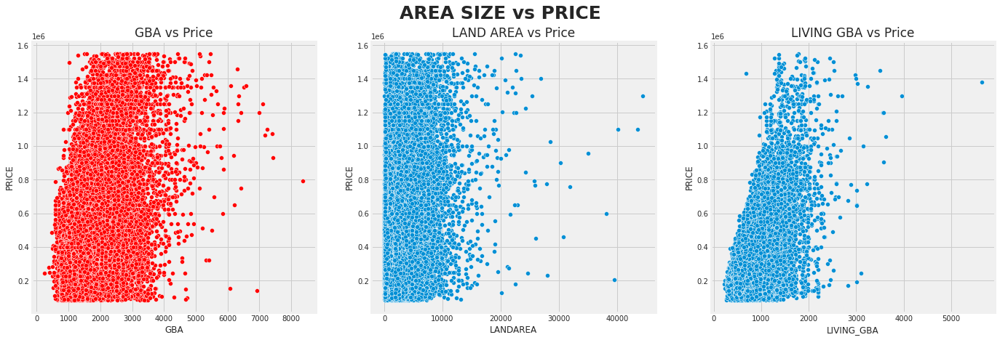

In [170]:
fig, ax =plt.subplots(1,3,figsize=(20,7))
sns.scatterplot(x='GBA',y='PRICE',data=df_viz_95,ax=ax[0],color='r').set_title('GBA vs Price', fontsize=17)
sns.scatterplot(x='LANDAREA',y='PRICE',data=df_viz_95,ax=ax[1]).set_title('LAND AREA vs Price', fontsize=17)
sns.scatterplot(x='LIVING_GBA',y='PRICE',data=df_viz_95,ax=ax[2]).set_title('LIVING GBA vs Price', fontsize=17)
fig.suptitle('AREA SIZE vs PRICE', fontsize=25, fontweight='bold')
fig.tight_layout(pad=4)
plt.show()

## **PROPERTIES FEATURE**

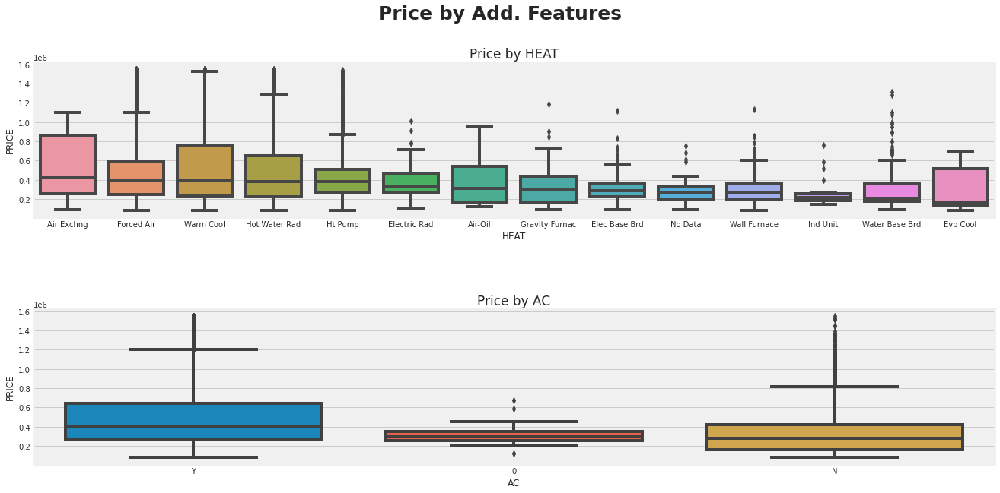

In [181]:
boxplot_cat_price(df_viz_95,['HEAT','AC','PRICE'],2,1,(20,10),'Price by Add. Features',7)

in AC, the 0 value seems to be an N. We might encode it first to get better visualization

In [182]:
add_feat = df_viz_95.copy()
add_feat['AC'] = np.where(df_viz_95['AC']=='Y',1,0) #change to 1,0

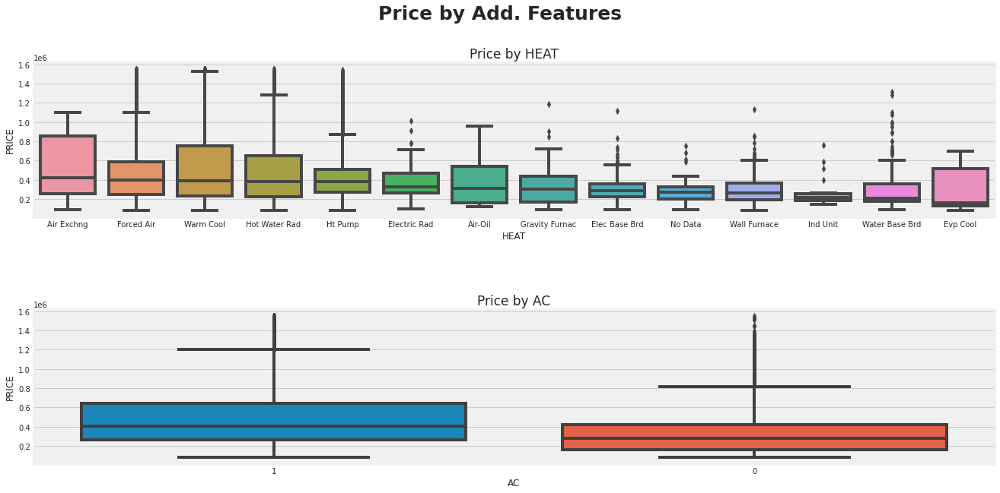

In [176]:
boxplot_cat_price(add_feat,['HEAT','AC','PRICE'],2,1,(20,10),'Price by Add. Features',7)

In [211]:
for i in ['HEAT','AC']:
  kruskal_price(i,df_t)
  print()

Kruskal-Wallis Test results of HEAT
H Stat = 756.746057319831
P = 2.5139992972469934e-153

Kruskal-Wallis Test results of AC
H Stat = 3259.7435781772742
P = 0.0



Since all the P-Value is below the alpha 0.05, we reject H0 which means the population distribution for each features vs price are different. This shows all three features (Heat and AC) can distinguish price value.

## **GRADE AND CONDITION**

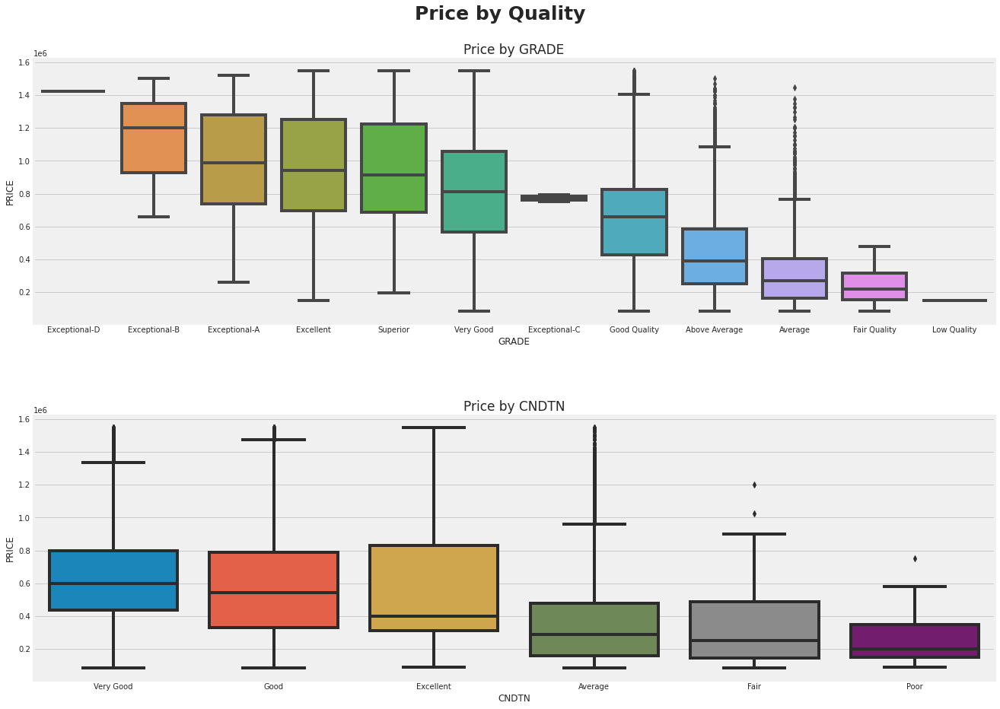

In [183]:
boxplot_cat_price(df_viz_95,['GRADE','CNDTN','PRICE'],2,1,(20,14),'Price by Quality',7)

In [209]:
for i in ['GRADE','CNDTN']:
  kruskal_price(i,df_t)
  print()

Kruskal-Wallis Test results of GRADE
H Stat = 14318.396538748537
P = 0.0

Kruskal-Wallis Test results of CNDTN
H Stat = 6805.031821984227
P = 0.0



Since all the P-Value is below the alpha 0.05, we reject H0 which means the population distribution for each features vs price are different. This shows both features (GRADE and CNDTN) can distinguish price value.

## **MATERIAL AND STRUCTURE**

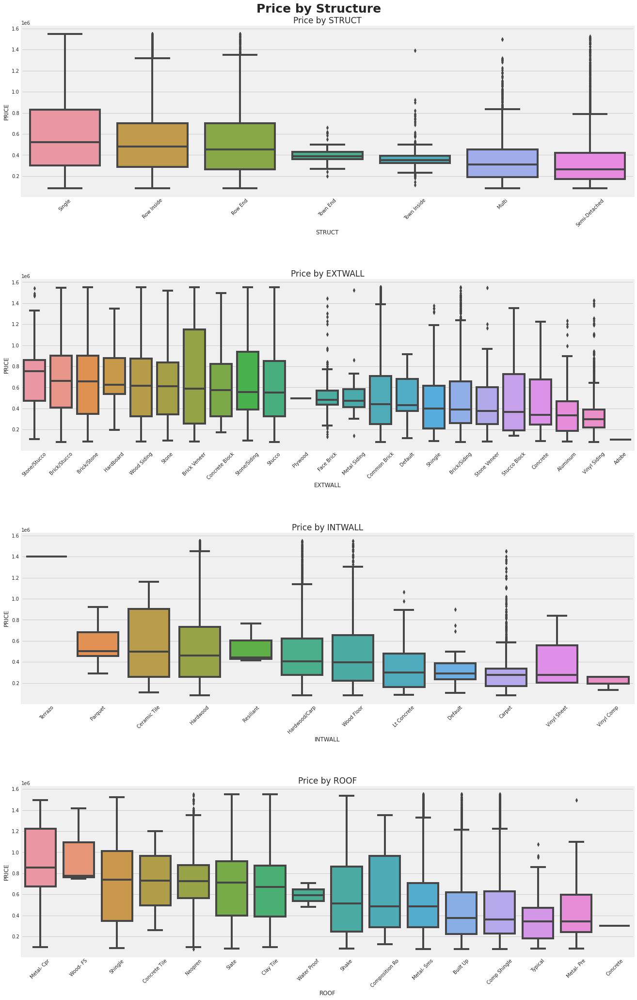

In [184]:
boxplot_cat_price(df_viz_95,['STRUCT','EXTWALL','INTWALL','ROOF','PRICE'],4,1,(20,30),'Price by Structure',7,45)

In [213]:
for i in ['STRUCT','EXTWALL','INTWALL','ROOF']:
  kruskal_price(i,df_t)
  print()

Kruskal-Wallis Test results of STRUCT
H Stat = 2831.576194277554
P = 0.0

Kruskal-Wallis Test results of EXTWALL
H Stat = 1552.8301595952032
P = 0.0

Kruskal-Wallis Test results of INTWALL
H Stat = 861.0809433662909
P = 1.4368369073181774e-177

Kruskal-Wallis Test results of ROOF
H Stat = 2940.804387737934
P = 0.0



Since all the P-Value is below the alpha 0.05, we reject H0 which means the population distribution for each features vs price are different. This shows all four features (Struct, Extwall, Intwall and Roof) can distinguish price value.

## **OTHER NUMERICAL FEATURES**

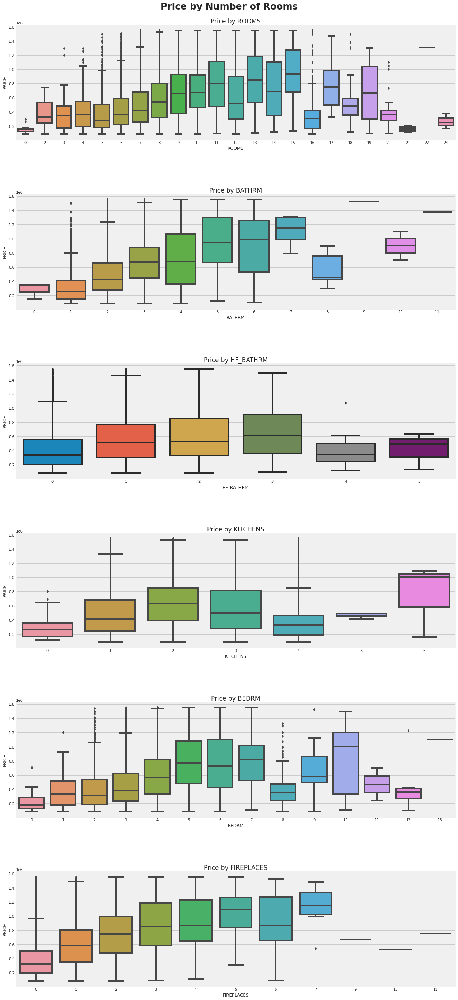

In [186]:
boxplot_cat_price(df_viz_95,['ROOMS','BATHRM','HF_BATHRM','KITCHENS','BEDRM','FIREPLACES','PRICE'],6,1,(20,40),'Price by Number of Rooms',10,ord=False)

In [215]:
for i in ['ROOMS','BATHRM','HF_BATHRM','KITCHENS','BEDRM','FIREPLACES']:
  kruskal_price(i,df_t)
  print()

Kruskal-Wallis Test results of ROOMS
H Stat = 10409.458933787404
P = 0.0

Kruskal-Wallis Test results of BATHRM
H Stat = 17767.521182832916
P = 0.0

Kruskal-Wallis Test results of HF_BATHRM
H Stat = 6624.535381847684
P = 0.0

Kruskal-Wallis Test results of KITCHENS
H Stat = 1207.0318006660773
P = 1.4393333691051142e-257

Kruskal-Wallis Test results of BEDRM
H Stat = 10383.427330007271
P = 0.0

Kruskal-Wallis Test results of FIREPLACES
H Stat = 11840.667444750792
P = 0.0



Since all the P-Value is below the alpha 0.05, we reject H0 which means the population distribution for each features vs price are different. This shows all features (Rooms, Bathrm, HF_Bathrm, Kitchens, Bedrm, and Fireplaces) can distinguish price value.

Next, we would like to see whether any correlation between these features with price

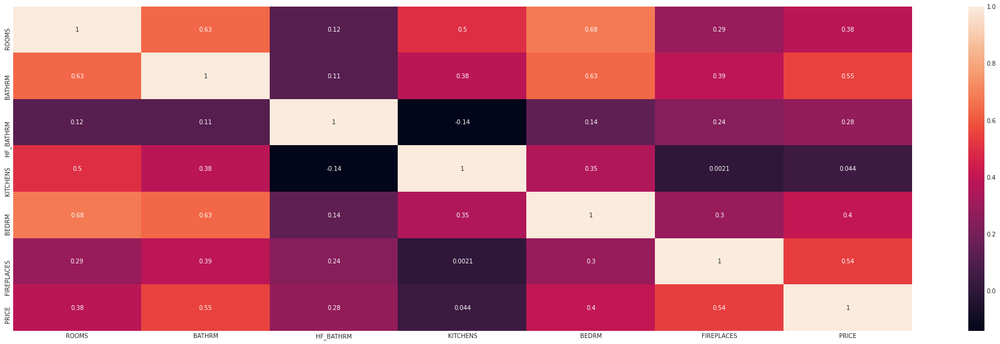

In [216]:
num_feat = df_t[['ROOMS','BATHRM','HF_BATHRM','KITCHENS','BEDRM','FIREPLACES','PRICE']].copy().dropna()

plt.figure(figsize=(30,10))
sns.heatmap(num_feat.corr(), annot=True, cmap='rocket')
plt.show()

In [191]:
!pip install network

In [192]:
import networkx as nx

In [193]:
corr = df_t.corr()

In [194]:
indices = corr.index.values
cor_matrix = np.asmatrix(corr)
G = nx.from_numpy_matrix(cor_matrix)
G = nx.relabel_nodes(G,lambda x: indices[x])
G.edges(data=True)

EdgeDataView([('BATHRM', 'BATHRM', {'weight': 1.0}), ('BATHRM', 'HF_BATHRM', {'weight': 0.30919270481612326}), ('BATHRM', 'NUM_UNITS', {'weight': 0.3515941891510359}), ('BATHRM', 'ROOMS', {'weight': 0.7142067640042331}), ('BATHRM', 'BEDRM', {'weight': 0.7137514946712921}), ('BATHRM', 'AYB', {'weight': -0.0603995923355884}), ('BATHRM', 'YR_RMDL', {'weight': 0.22874902198576821}), ('BATHRM', 'EYB', {'weight': 0.27547301007464636}), ('BATHRM', 'STORIES', {'weight': 0.020390956252384084}), ('BATHRM', 'PRICE', {'weight': 0.5704467943490945}), ('BATHRM', 'SALE_NUM', {'weight': 0.04606458187625916}), ('BATHRM', 'GBA', {'weight': 0.7000374070228619}), ('BATHRM', 'BLDG_NUM', {'weight': -0.005924711634658654}), ('BATHRM', 'KITCHENS', {'weight': 0.38275772204487457}), ('BATHRM', 'FIREPLACES', {'weight': 0.4459203716222271}), ('BATHRM', 'LANDAREA', {'weight': 0.4700024481461279}), ('BATHRM', 'CMPLX_NUM', {'weight': 0.1282816281509332}), ('BATHRM', 'LIVING_GBA', {'weight': 0.7340853760064814}), ('B

In [195]:
def corr_network(G, corr_direction, min_correlation):
    H = G.copy()

    for s1, s2, weight in G.edges(data=True):       
        if corr_direction == "positive":
            if weight["weight"] < 0 or weight["weight"] < min_correlation:
                H.remove_edge(s1, s2)
        else:
            if weight["weight"] >= 0 or weight["weight"] > min_correlation:
                H.remove_edge(s1, s2)
                
    edges,weights = zip(*nx.get_edge_attributes(H,'weight').items())
    
    weights = tuple([(1+abs(x))**2 for x in weights])
   
    d = dict(nx.degree(H))
    nodelist=d.keys()
    node_sizes=d.values()
    
    positions=nx.circular_layout(H)
    
    plt.figure(figsize=(10,10))

    nx.draw_networkx_nodes(H,positions,node_color='#34ebe1',nodelist=nodelist,
                       node_size=tuple([x**3 for x in node_sizes]),alpha=0.8)

    nx.draw_networkx_labels(H, positions, font_size=8)

    if corr_direction == "positive":
        edge_colour = plt.cm.winter 
    else:
        edge_colour = plt.cm.autumn
        
    nx.draw_networkx_edges(H, positions, edgelist=edges,style='solid',
                          width=weights, edge_color = weights, edge_cmap = edge_colour,
                          edge_vmin = min(weights), edge_vmax=max(weights))
    plt.axis('off')
    plt.show() 

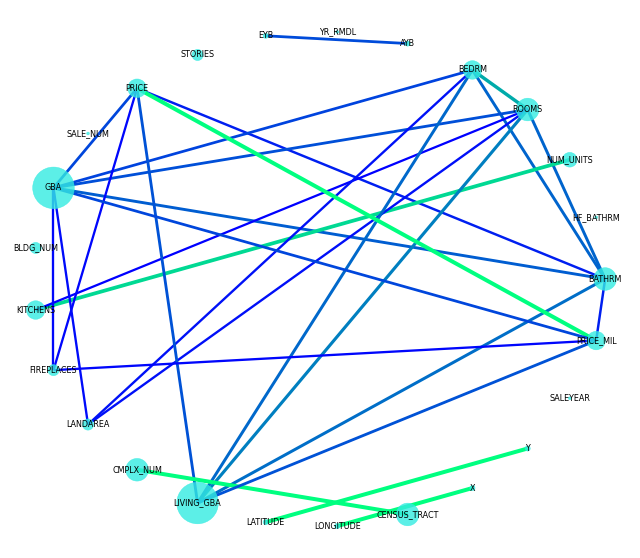

In [196]:
corr_network(G, corr_direction="positive",min_correlation = 0.5)

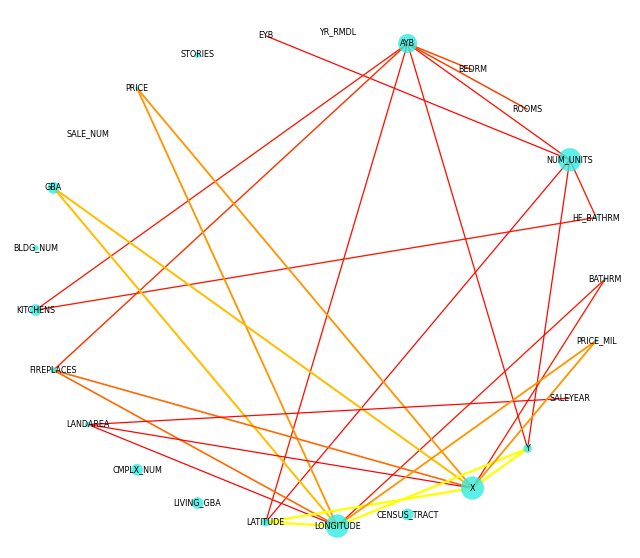

In [197]:
corr_network(G, corr_direction="negative",min_correlation = -0.1)